## COVID Tissue Atlas: Data processing for a single organ
Covid Tissue Atlas, CZ Biohub <br>
Authors: Alejandro Granados, Ann Chen <br>github: agranado, atchen<br>
Date: Sep 1st 2021 <br>
Organ: Liver <br>

We applied CellBender (fpr 0.01) to the raw counts for decontamination. This notebook applies quality control, batch correction and annotation of cell types for the Heart samples of the COVID Tissue Atlas. 

 - Batch correction requires SCVI tools
 - Doublet detection requires scrublet
 - Visualization: seaborn 

In [1]:
# sample name for adata object
# example: creating adata object for all prostate samples from 10x files (sample_name = 'prostate')

sample = 'liver/'
tissue = sample.split('/')[0]
sample_name = sample + '_cb'

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
import os
import scvi
import sys

sys.path.append('/mnt/ibm_lg/covid_tissue_atlas/CovidTissueAtlas/cta_utils/')
import utils

/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/pytorch_lightning/metrics/__init__.py:43: LightningDeprecationWarning: `pytorch_lightning.metrics.*` module has been renamed to `torchmetrics.*` and split off to its own package (https://github.com/PyTorchLightning/metrics) since v1.3 and will be removed in v1.5
  rank_zero_deprecation(


In [3]:
# make folder for processed adata object and figures
data_directory = '/mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/'



figure_directory = data_directory

if not os.path.exists(data_directory):
    os.makedirs(data_directory)
    #os.makedirs(sample_name + '_data/' + sample_name + '_figures')

#print package versions
print('package versions:')
print('\n'.join(f'{m.__name__} {m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))

# make sure you use these two parameters before saving figures to pdf
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=150)

package versions:
numpy 1.21.0
pandas 1.2.5
seaborn 0.11.0
scanpy 1.7.2
scvi 0.11.0


In [4]:
data_path =  data_directory + sample

# ignore hidden files in directory (ignore files that beginw with .)
# data_folders = os.listdir(data_path)
data_folders = [f for f in os.listdir(data_path) if not f.startswith('.')]
#data_folders.remove('Cov19-Control2_Lung_dX.h5ad')
display(data_folders)

['Cov19_S112_liver_cellbender.h5',
 'Cov19_37_liver_cellbender.h5',
 'Cov19_46_liver_cellbender.h5',
 'Cov19_S99_liver_cellbender.h5',
 'Cov19_34_liver_cellbender.h5',
 'Cov19_S113_liver_cellbender.h5',
 'Cov19_S72_liver_cellbender.h5',
 'Cov19_12-22_liver_cellbender.h5',
 'Control_38_liver_cellbender.h5',
 'Cov19_1-6_liver_cellbender.h5',
 'Cov19_S02_liver_cellbender.h5',
 'Cov19_12-29_liver_cellbender.h5',
 'Cov19_527_liver_cellbender.h5',
 'Cov19_S100_liver_cellbender.h5',
 'Control_HuLi028-2_liver_cellbender.h5',
 'Control_TS02_liver_cellbender.h5',
 'Cov19_12-1_liver_cellbender.h5',
 'Cov19_12-14_liver_cellbender.h5',
 'Cov19_1-5_liver_cellbender.h5',
 'Cov19_45_liver_cellbender.h5']

In [5]:
adata = utils.read_cellbender_h5ad_to_combined_adata(data_path)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_S112_liver_cellbender.h5


Cov19_S112_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S112_liver_cellbender.h5 size


(13699, 33567)

/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/scipy/sparse/sputils.py:114: UserWarning: object dtype is not supported by sparse matrices
  warnings.warn("object dtype is not supported by sparse matrices")
reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_37_liver_cellbender.h5
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_37_liver_cellbender.h5
Cov19_37_liver_cellbender.h5 size


(18279, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_46_liver_cellbender.h5
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_46_liver_cellbender.h5
Cov19_46_liver_cellbender.h5 size


(5433, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_S99_liver_cellbender.h5


Cov19_S99_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S99_liver_cellbender.h5 size


(381, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_34_liver_cellbender.h5


Cov19_34_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_34_liver_cellbender.h5 size


(3867, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_S113_liver_cellbender.h5


Cov19_S113_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S113_liver_cellbender.h5 size


(146, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_S72_liver_cellbender.h5


Cov19_S72_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S72_liver_cellbender.h5 size


(25000, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_12-22_liver_cellbender.h5


Cov19_12-22_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_12-22_liver_cellbender.h5 size


(8998, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Control_38_liver_cellbender.h5


Control_38_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Control_38_liver_cellbender.h5 size


(3105, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_1-6_liver_cellbender.h5


Cov19_1-6_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_1-6_liver_cellbender.h5 size


(12518, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_S02_liver_cellbender.h5


Cov19_S02_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S02_liver_cellbender.h5 size


(7086, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_12-29_liver_cellbender.h5


Cov19_12-29_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_12-29_liver_cellbender.h5 size


(9698, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_527_liver_cellbender.h5


Cov19_527_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_527_liver_cellbender.h5 size


(5465, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_S100_liver_cellbender.h5


Cov19_S100_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S100_liver_cellbender.h5 size


(12721, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Control_HuLi028-2_liver_cellbender.h5
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Control_HuLi028-2_liver_cellbender.h5
Control_HuLi028-2_liver_cellbender.h5 size


(1553, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Control_TS02_liver_cellbender.h5


Control_TS02_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Control_TS02_liver_cellbender.h5 size


(8517, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_12-1_liver_cellbender.h5


Cov19_12-1_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_12-1_liver_cellbender.h5 size


(6950, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_12-14_liver_cellbender.h5


Cov19_12-14_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_12-14_liver_cellbender.h5 size


(9208, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_1-5_liver_cellbender.h5


Cov19_1-5_liver_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_1-5_liver_cellbender.h5 size


(12892, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/liver/Cov19_45_liver_cellbender.h5
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_45_liver_cellbender.h5
Cov19_45_liver_cellbender.h5 size


(5473, 33567)

In [6]:
adata.obs['replicate'] = adata.obs['replicate'].astype(str)
adata.obs['tissue'] = sample.split('/')[0]

In [7]:
adata.obs['lab'].value_counts()

S72          25000
37           18279
S112         13699
1-5          12892
S100         12721
1-6          12518
12-29         9698
12-14         9208
12-22         8998
TS02          8517
S02           7086
12-1          6950
45            5473
527           5465
46            5433
34            3867
38            3105
HuLi028-2     1553
S99            381
S113           146
Name: lab, dtype: int64

### Pre-filtering QC metrics

In [8]:
adata.var_names_make_unique() 

... storing '10X_run' as categorical
... storing 'disease_status' as categorical
... storing 'lab' as categorical
... storing 'tissue' as categorical
... storing 'Barcode' as categorical
... storing 'replicate' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


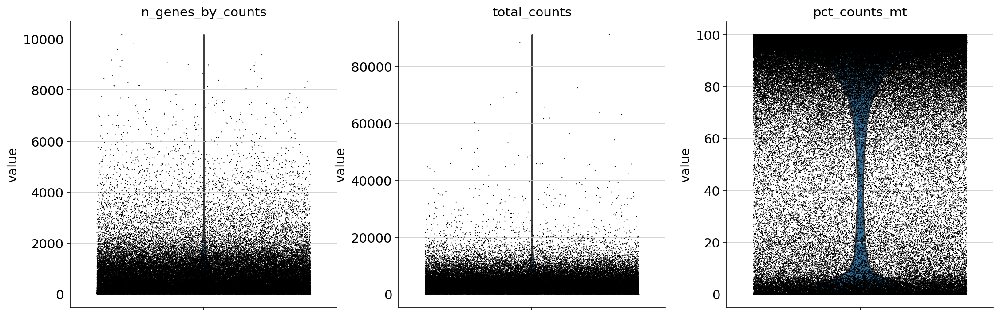

In [9]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Text(0.5, 1.0, '% mt-genes across all cells-prefilter')

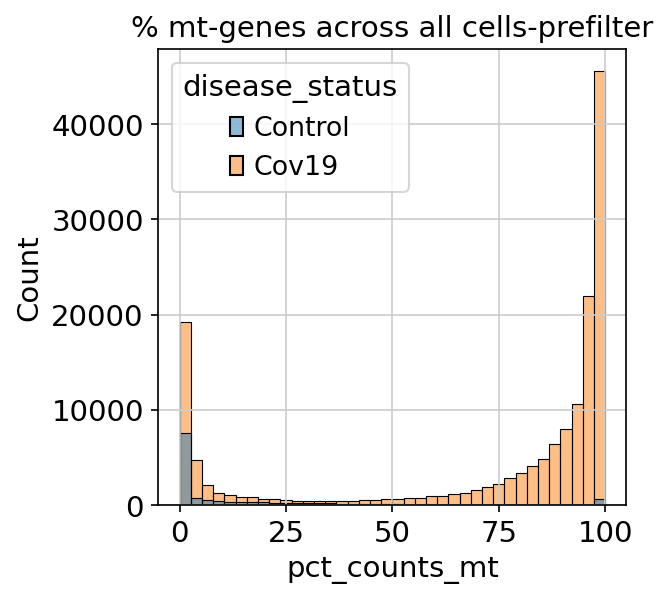

In [10]:
sns.histplot(data=adata.obs, x ='pct_counts_mt',hue='disease_status')
plt.title('% mt-genes across all cells-prefilter')
#plt.savefig(figure_directory + sample_name + '-hist_prefiltered_percent_mito-disease_status.pdf',bbox_inches = 'tight')

In [11]:
adata.obs['log_ncounts']  = np.log10(adata.obs.total_counts)
adata.obs['log_ngenes'] = np.log10(adata.obs['n_genes_by_counts'])

/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [12]:
## freeze counts in layer
adata.layers["counts"] = adata.X.copy()

Text(0.5, 1.0, 'Library size-prefilter')

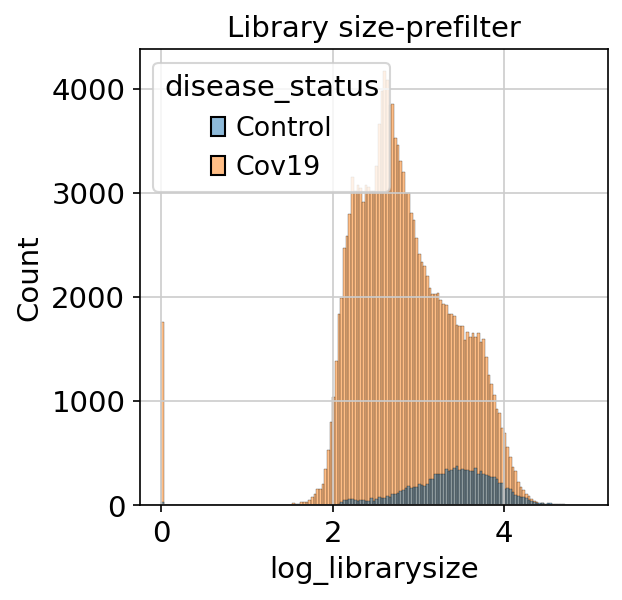

In [13]:
adata.obs['log_librarysize']  =np.log10(np.sum(adata.layers['counts'], axis =1) + 1)
sns.histplot(data=adata.obs, x='log_librarysize',hue='disease_status')
plt.title('Library size-prefilter')
#plt.savefig(figure_directory + sample_name + '-hist_prefiltered_library_size-disease-status.pdf',bbox_inches = 'tight')

In [14]:
adata_unfiltered = adata

In [23]:
adata = utils.filter_adata( adata_unfiltered,min_n_counts=500, 
                           min_n_genes=200, filter='percent_mito',
                              mt_cutoff = 15, filter_max = 30000)


# make sure to check out the distributions again 

filtered out 4206 genes that are detected in less than 3 cells
filtered out 128036 cells that have less than 500 counts
filtered out 101 cells that have more than 30000 counts
filtered out 568 cells that have less than 200 genes expressed


In [24]:
adata

View of AnnData object with n_obs × n_vars = 25287 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

Text(0.5, 1.0, 'Library size-filtered')

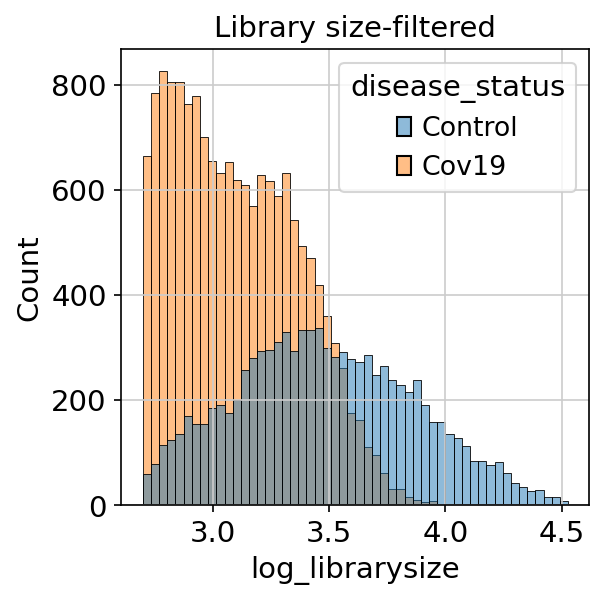

In [26]:
adata.obs['log_librarysize']  =np.log10(np.sum(adata.layers['counts'], axis =1))
sns.histplot(data=adata.obs, x='log_librarysize',hue='disease_status')
plt.title('Library size-filtered')
#plt.savefig(figure_directory + sample_name + '-hist_filter_library_size-disease-status.pdf',bbox_inches = 'tight')

In [27]:
adata.obs['lab'].value_counts() 

1-5          8427
TS02         7885
1-6          4711
12-29        1453
HuLi028-2    1012
38            491
12-22         407
527           302
S100          251
S112          110
S99            69
S72            63
12-14          50
34             36
12-1           13
S02             4
46              3
Name: lab, dtype: int64

In [34]:
adata = utils.run_scvi(adata, n_layers=2, n_latent=64)

normalizing counts per cell
    finished (0:00:00)


INFO     Using batches from adata.obs["10X_run"]                                             
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 24939 cells, 33567 vars, 9        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 321/321: 100%|██████████| 321/321 [36:12<00:00,  6.77s/it, loss=4.33e+03, v_num=1]


In [35]:
adata = utils.compute_neighbors(adata, use_rep='X_scVI')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


### Make SCVI-corrected UMAPs colored by patient source and disease status

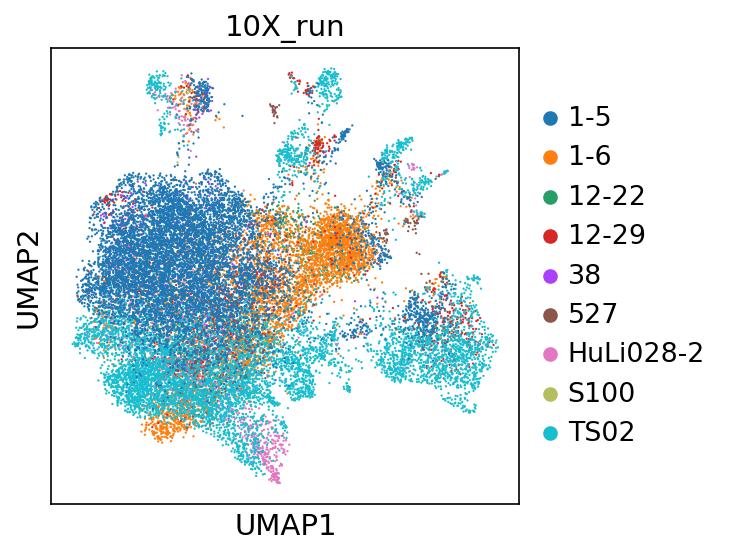

In [36]:
color_by ='10X_run'
sc.pl.umap(
    adata,
    color=[color_by]
)
#plt.savefig(figure_directory + sample_name + '-filtered_UMAP-scvi_disease-status.pdf',bbox_inches = 'tight')

### Library size per sample

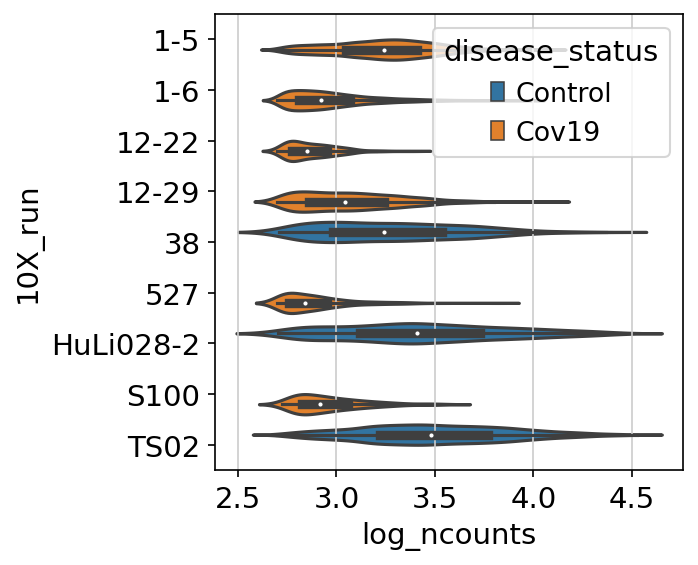

In [37]:
res = sns.violinplot(data =adata.obs, x= 'log_ncounts',y='10X_run', hue='disease_status')
#plt.savefig(figure_directory + sample_name + '-violin-plot-log-counts.pdf',bbox_inches = 'tight')

In [38]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden', method = 'wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:04)


In [39]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,ORM1,SERPINA1,ECHDC2,RBFOX1,ZC3H13,ST6GALNAC3,TSHZ2,NEAT1,MT-CO3,MT-ND4,SORBS1,ADH1B,BICC1,PRKG1,SLC7A2,FMNL2,ST6GALNAC3,CELF2,QKI
1,SAA1,APOC3,CYP2C9,CNTNAP2,PID1,LDB2,PID1,MLXIPL,MT-ND4,MT-ND1,EXT1,TAT,PKHD1,GRK5,MT1M,SAT1,LDB2,MBNL1,ERBB4
2,SERPINA1,MT2A,ACSM2B,CSMD1,ZBTB20,PTPRB,ZBTB20,ASGR1,MT-CO2,MT-ATP6,GREM2,MT-ND3,CTNND2,CALD1,MT2A,TBXAS1,FLT1,ANKRD44,BBX
3,FGA,GPX3,ADRA1A,KAZN,SDS,PPFIBP1,IMMP2L,ECHDC2,MT-CYB,MT-CYB,NEDD4L,SOX5,ANXA4,ADAMTS2,MT1F,CELF2,PTPRB,BCL2,PRKD1
4,HP,HPD,LINC01146,LRP1B,AL391117.1,LIFR,NAMPT,COL18A1,MT-ND2,MT-CO3,TSHZ2,HP,THSD4,ZFPM2,GREM2,CD163,DNASE1L3,PARP8,TANC2
5,ALB,MT1G,C5,CDH13,SOX5,LINC02388,ZC3H13,MST1,MT-ND1,MT-ND2,EGFR,CPS1,FGFR2,MALAT1,HAL,SLC8A1,PPFIBP1,CCND3,GPC5
6,NDRG1,CRP,TPRG1,PCDH15,IMMP2L,FLT1,ADK,PLIN5,MT-ATP6,MT-ND3,RORA,MT-ATP6,GLIS3,RIPOR3,A2M,FMN1,EGFL7,PTPRC,PLXDC2
7,APOB,MT-CO1,GPHN,NRXN3,GPHN,AUTS2,EXT1,TFR2,MT-ND3,MT-CO1,RAB1A,TTR,MAGI1,PTH1R,MT1G,ZEB2,GALNT18,ARHGAP15,CCSER1
8,FGG,FGA,AFM,PTPRD,TSHZ2,NRG3,GPHN,C3,MT-CO1,MT-CO2,NDRG1,AOX1,EFNA5,LAMA2,PCK1,MERTK,SEC14L1,PIP4K2A,NCAM2
9,MT2A,SAA1,ITPR2,CALN1,ADRA1A,DNASE1L3,RORA,SLC22A7,MT-ND5,DHFR,ELL2,CYP3A4,MAML2,CCBE1,INSIG1,CTSB,SHANK3,CHST11,CTNNA2


In [40]:
louvain_degs = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
#louvain_degs.to_csv(data_directory + '/' + sample_name + '-leiden-degs.csv')

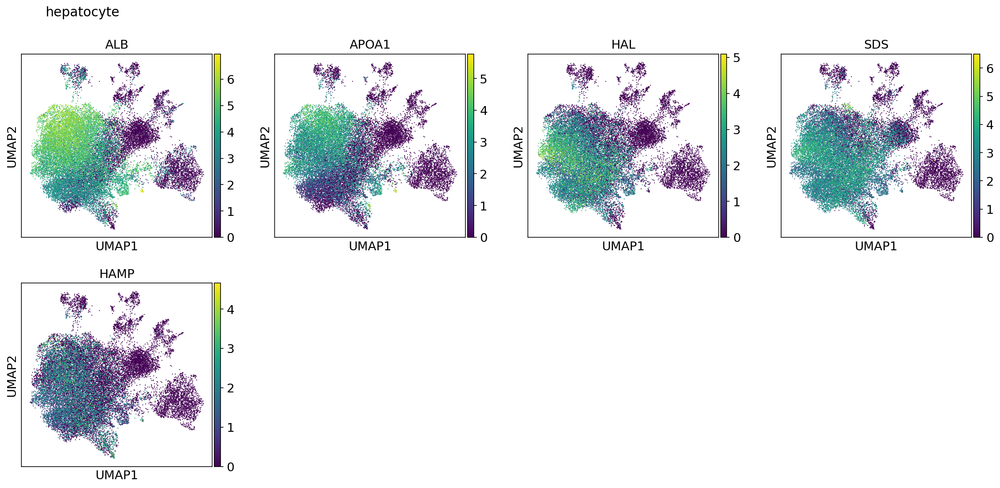

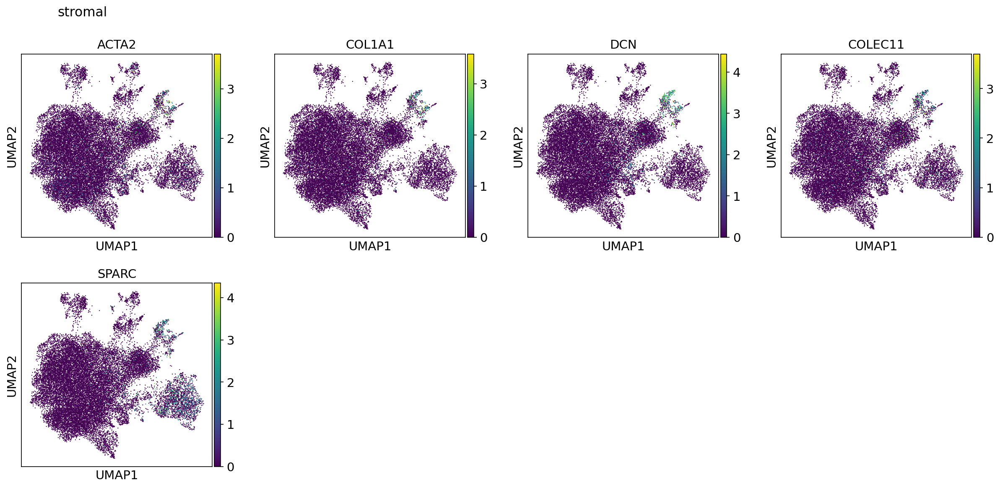

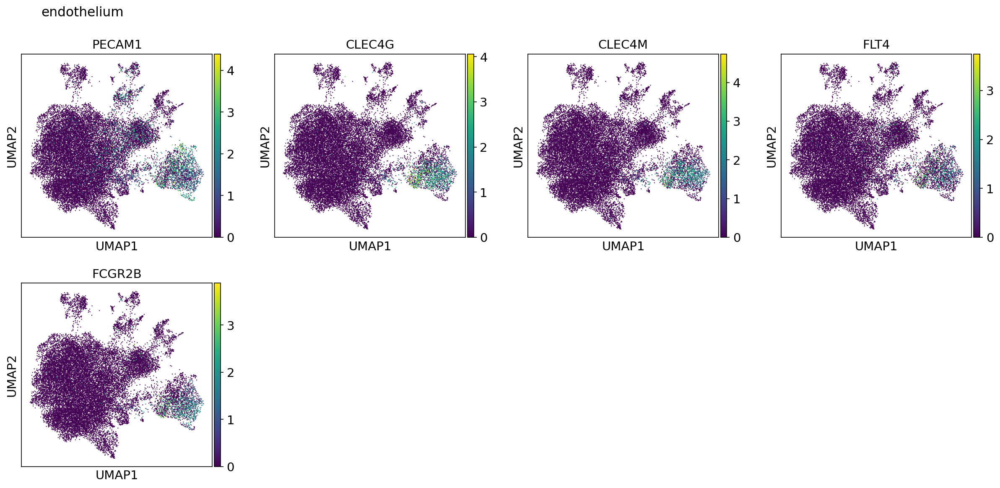

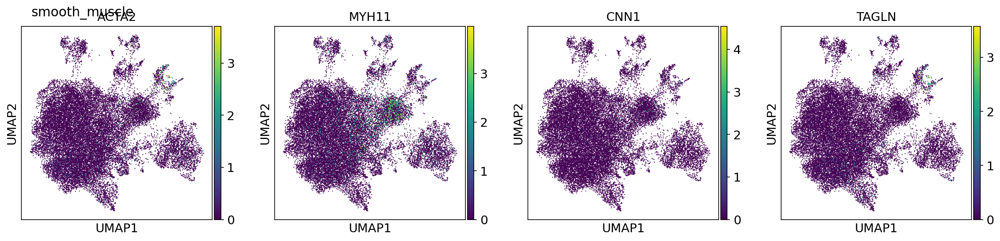

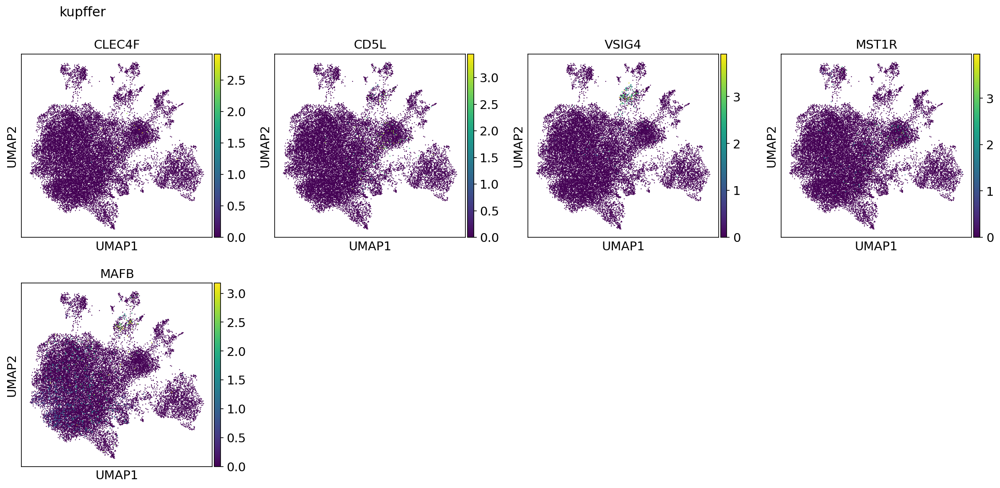

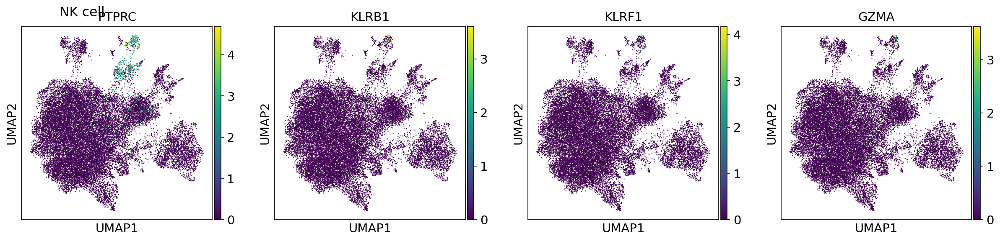

In [41]:
#markers = all_markers[sample.split('/')[0]] # choose the organ here 
markers = utils.get_markers(tissue)
for cell_type in markers:
    sc.pl.umap(adata,
          color =markers[cell_type], #[cell_type],
          return_fig = True)
    
    plt.suptitle(cell_type, x = 0.1, fontsize=15)
    #plt.savefig(data_directory + sample_name + '_UMAP-' + cell_type + '.pdf')

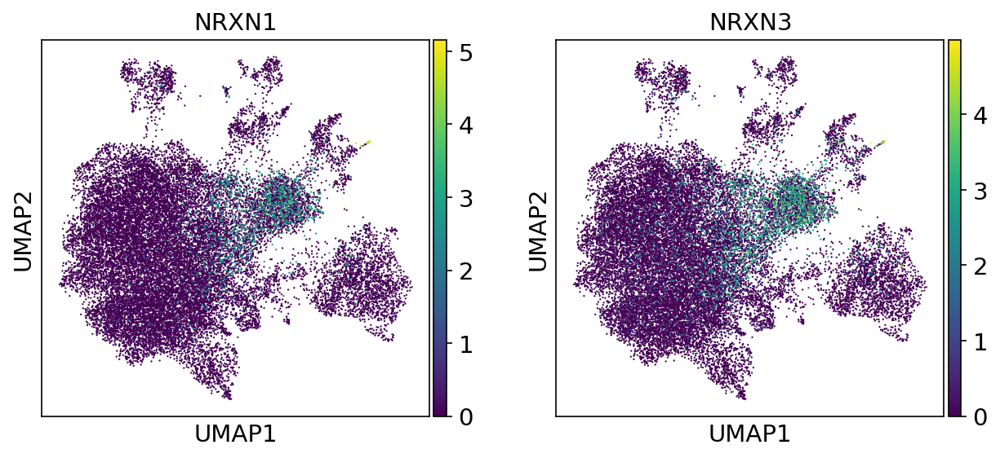

In [42]:
sc.pl.umap(adata, color=['NRXN1', 'NRXN3'])

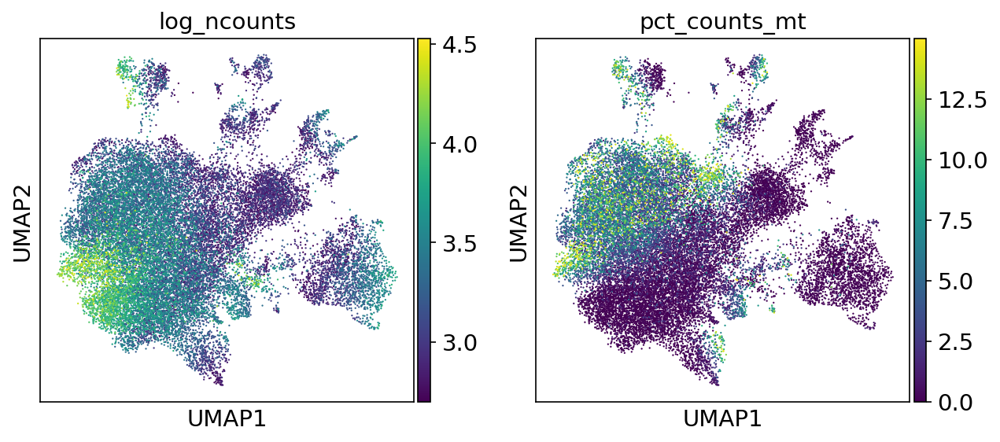

In [43]:
sc.pl.umap(adata, color=['log_ncounts','pct_counts_mt'])

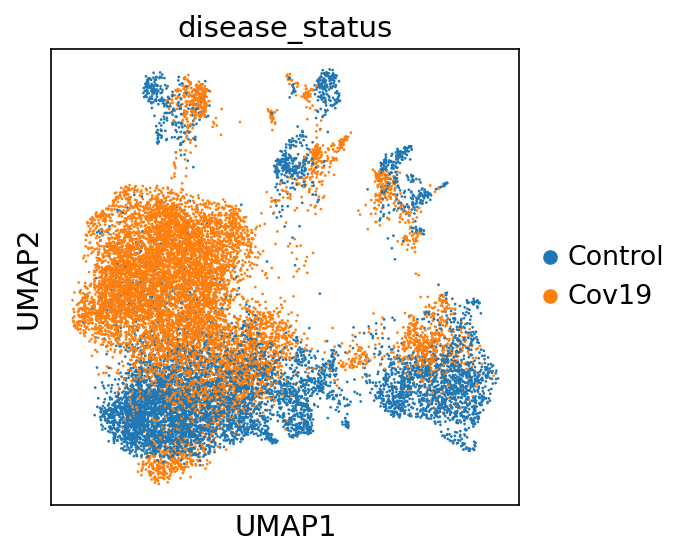

In [113]:
sc.pl.umap(adata, 
          color='disease_status')

In [48]:
n_cells = adata.X.shape[0]
n_cells

24939

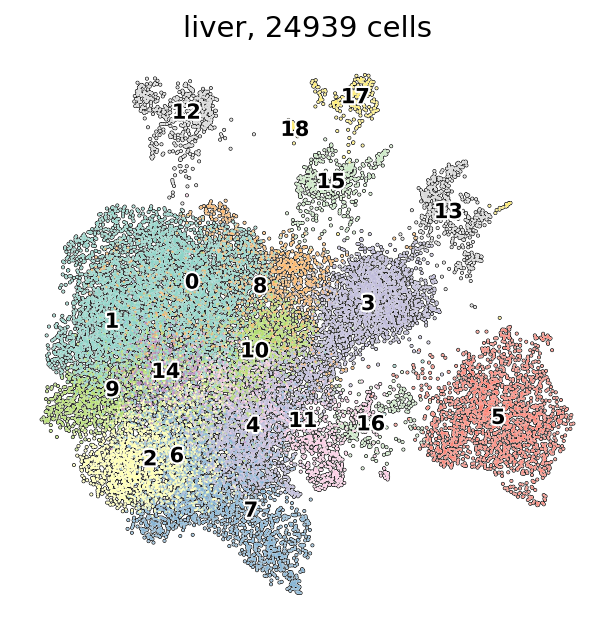

In [49]:
from matplotlib.pyplot import rc_context
tissue = sample.split('/')[0]
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='leiden', add_outline=True, legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {n_cells} cells', palette='Set3')

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:56)
Storing dendrogram info using `.uns['dendrogram_leiden']`


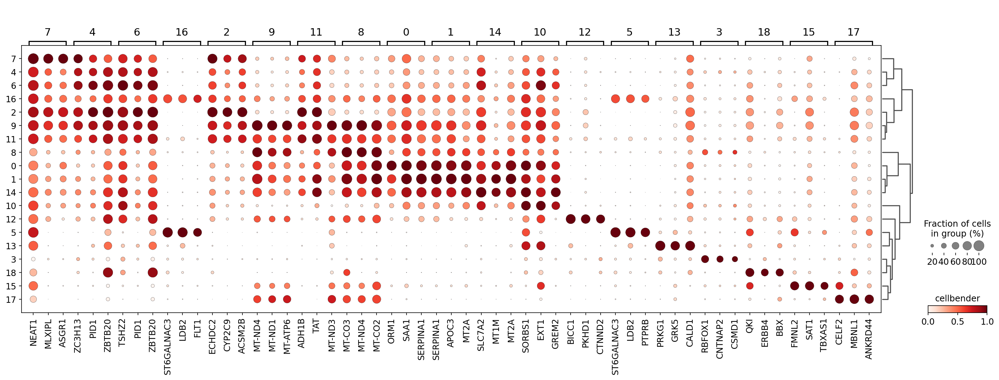

In [47]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=3, standard_scale='var', colorbar_title='cellbender')

categories: 0, 1, 2, etc.
var_group_labels: hepatocyte, stromal, endothelium, etc.


{'mainplot_ax': <AxesSubplot:>,
 'group_extra_ax': <AxesSubplot:>,
 'gene_group_ax': <AxesSubplot:>,
 'size_legend_ax': <AxesSubplot:title={'center':'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <AxesSubplot:title={'center':'cellbender'}>}

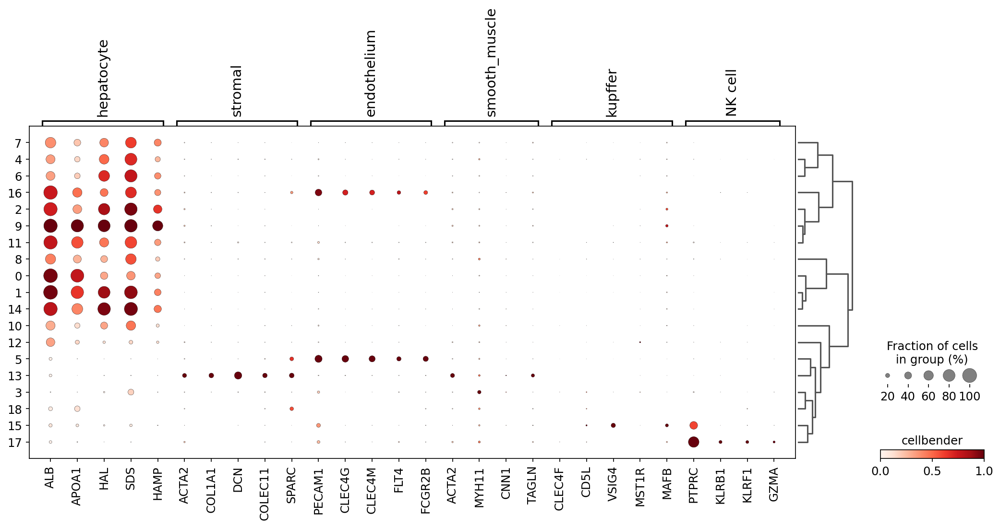

In [50]:

fig, (ax1) = plt.subplots(1, 1, figsize=(17,7), gridspec_kw={'wspace':0.9})

sc.pl.dotplot(adata, 
              var_names= utils.get_markers(tissue),
              layer='counts',
              groupby='leiden',
              log=True,
              standard_scale='var',
              colorbar_title = 'cellbender',
              dendrogram=True, ax = ax1, show = False)

## Check for Gene contamination

Select the top expressed genes in the contaminated clusters

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_10X_run']`


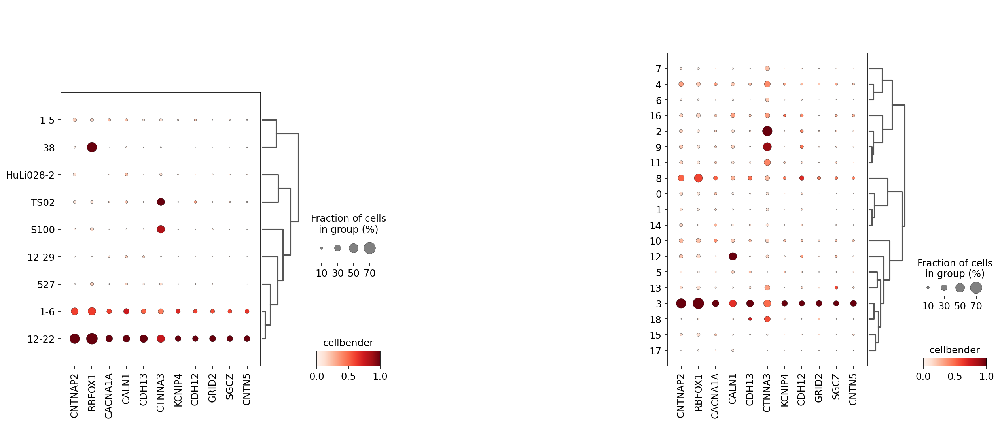

In [51]:
from matplotlib import pyplot as plt

bad_genes = ['CNTNAP2', 'RBFOX1','CACNA1A', 'CALN1', 'CDH13', 'CTNNA3', 
                          'KCNIP4', 'CDH12', 'GRID2', 'SGCZ','CNTN5']


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8), gridspec_kw={'wspace':0.9})

ax1_dict = sc.pl.dotplot(adata, 
              var_names= bad_genes, 
              layer='counts',
              groupby='10X_run',
              log=True,
              standard_scale='var',
              colorbar_title = 'cellbender',
              dendrogram=True, 
              ax = ax1, show=False)

ax2_dict = sc.pl.dotplot(adata, 
              var_names= bad_genes, 
              layer='counts',
              groupby='leiden',
              log=True,
              standard_scale='var',
              colorbar_title = 'cellbender',
              dendrogram=True, 
              ax = ax2, show = False)

In [50]:
louvain_degs.to_csv(f'/mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/DEGs.csv')

In [44]:
tissue_objects_path= '/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects'
adata.write(f'{tissue_objects_path}/{tissue}_cellbender_scvi.h5ad')

## Doublet detection

In [52]:
test_dat = adata.copy()
test_dat.X = adata.layers['counts']

In [53]:
sc.external.pp.scrublet(test_dat)

Running Scrublet
filtered out 5257 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    Scrublet finished (0:00:32)


Automatically set threshold at doublet score = 0.58
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 28.5%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.5%


(<Figure size 1200x450 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot:title={'center':'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

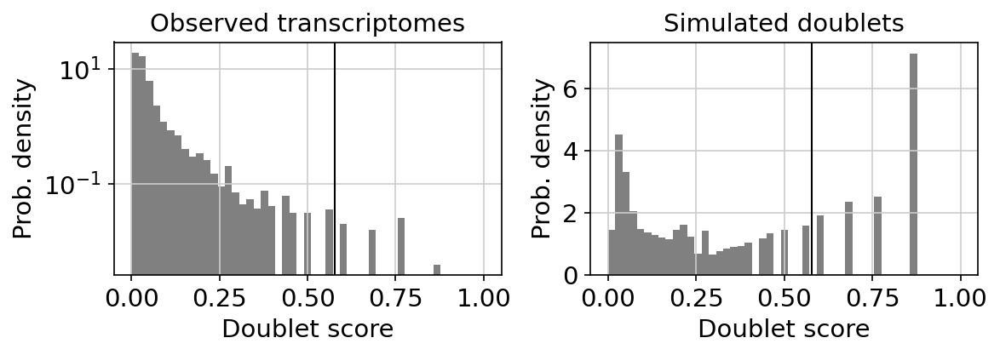

In [54]:
sc.external.pl.scrublet_score_distribution(test_dat)

In [55]:
adata.obs['doublet_score'] = test_dat.obs['doublet_score']
adata.obs['predicted_doublet'] = test_dat.obs['predicted_doublet'].astype(str)

<ipython-input-56-ca07c6b7c678>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['predicted_doublet'][doublets] = 'True'
... storing 'predicted_doublet' as categorical


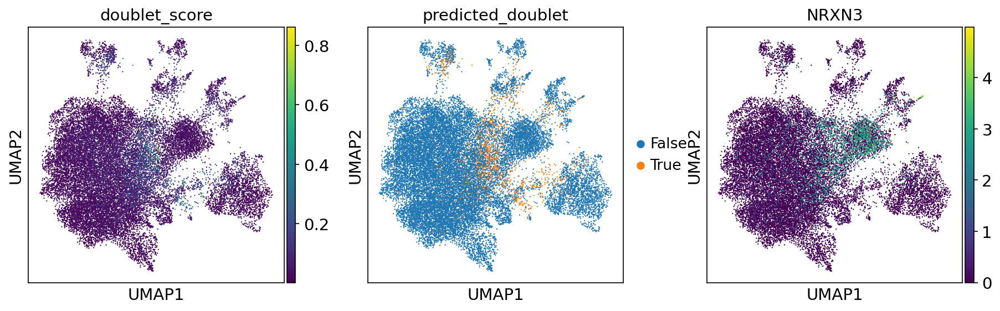

In [56]:
doublets = adata.obs['doublet_score'] > 0.12
adata.obs['predicted_doublet'][doublets] = 'True'
sc.pl.umap(adata, 
          color =['doublet_score','predicted_doublet','NRXN3'])

567 doublets predicted out of 17k cells

In [57]:
adata.obs['predicted_doublet'].value_counts()

False    23375
True      1564
Name: predicted_doublet, dtype: int64

In [58]:
1564/23375

0.0669090909090909

In [58]:
adata = adata[adata.obs['predicted_doublet'] == 'False']

In [59]:
adata

AnnData object with n_obs × n_vars = 24939 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'doublet_score', 'predicted_doublet'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', '_scvi', 'neighbors', 'leiden', 'umap', '10X_run_colors', 'rank_genes_groups', 'disease_status_colors', 'leiden_colors', 'dendrogram_leiden', 'dendrogram_10X_run', 'predicted_doublet_colors'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

## Integrate expert annotations
We can run the notebook starting from here 

In [60]:
tissue_objects_path= '/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects'
adata.write(f'{tissue_objects_path}/{tissue}_cellbender_scvi.h5ad')

This object 

In [61]:
sn_adata = sc.read_h5ad(f"{tissue_objects_path}/{tissue}_cellbender_scvi.h5ad")

Load preliminary annotations (v1)

In [62]:
ann_object_path = '/mnt/ibm_lg/alejandro/covid-tissue-atlas/annotated_objects/tidy_objects/liver_0727.h5ad'
ann_data = sc.read_h5ad( ann_object_path )

Wrangling sample labels and cell_id to match both datasets

In [63]:
meta = ann_data.obs

meta['cell_id'] = meta['lab'].astype(str) + "_" + meta['Barcode'].astype(str)

meta.head()

,Sample,Barcode,decontX_contamination,decontX_clusters,10X_run,disease_status,lab,tissue,replicate,batch,...,log_librarysize,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var,leiden,louvain,liver_poorvi_07222021,annotations_v1,cell_id
Cov19_1-6_liver_dX-AAACCCAGTACCAATC-1,Cov19_1-6_liver/filtered_feature_bc_matrix/,AAACCCAGTACCAATC-1,0.20820343730798968,1,Cov19_1-6_liver_dX,Cov19,1-6,liver,1,0,...,3.621098,5,0,7.56486,0.154051,5,4,hepatocyte,hepatocyte,1-6_AAACCCAGTACCAATC-1
Cov19_1-6_liver_dX-AAAGGATGTCCGGTGT-1,Cov19_1-6_liver/filtered_feature_bc_matrix/,AAAGGATGTCCGGTGT-1,0.011787405939346648,2,Cov19_1-6_liver_dX,Cov19,1-6,liver,1,0,...,3.221495,5,0,7.56486,0.154051,11,10,intrahepatic cholangiocyte,intrahepatic cholangiocyte,1-6_AAAGGATGTCCGGTGT-1
Cov19_1-6_liver_dX-AAAGGGCCAGATCATC-1,Cov19_1-6_liver/filtered_feature_bc_matrix/,AAAGGGCCAGATCATC-1,0.35255198284196015,1,Cov19_1-6_liver_dX,Cov19,1-6,liver,1,0,...,3.338849,5,0,7.56486,0.154051,14,2,hepatocyte,hepatocyte,1-6_AAAGGGCCAGATCATC-1
Cov19_1-6_liver_dX-AACAAAGAGGGCTTCC-1,Cov19_1-6_liver/filtered_feature_bc_matrix/,AACAAAGAGGGCTTCC-1,0.21817679396297687,1,Cov19_1-6_liver_dX,Cov19,1-6,liver,1,0,...,3.603067,5,0,7.56486,0.154051,5,3,hepatocyte,hepatocyte,1-6_AACAAAGAGGGCTTCC-1
Cov19_1-6_liver_dX-AACAAAGCAGTCACGC-1,Cov19_1-6_liver/filtered_feature_bc_matrix/,AACAAAGCAGTCACGC-1,0.40793022390035705,1,Cov19_1-6_liver_dX,Cov19,1-6,liver,1,0,...,3.392404,5,0,7.56486,0.154051,4,1,hepatocyte,hepatocyte,1-6_AACAAAGCAGTCACGC-1


In [64]:
meta_ann = ann_data.obs
meta_ann.set_index('cell_id',inplace = True, drop=False)

sn_adata.obs['cell_id'] = sn_adata.obs.index.tolist() 

common_cells = sn_adata.obs['cell_id'][sn_adata.obs['cell_id'].isin(meta['cell_id'])]

In [65]:
sn_adata.obs['annotations_v1'] = "unassigned"

In [66]:
sn_adata.obs['annotations_v1'].loc[common_cells] = meta.loc[common_cells]['annotations_v1'].astype(str)

/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [67]:
sn_adata.obs['annotations_v1'].value_counts() 

hepatocyte                              12245
unassigned                              10365
endothelial cell of hepatic sinusoid     1378
fibroblast                                281
intrahepatic cholangiocyte                273
macrophage                                245
natural killer cell                       152
Name: annotations_v1, dtype: int64

... storing 'annotations_v1' as categorical


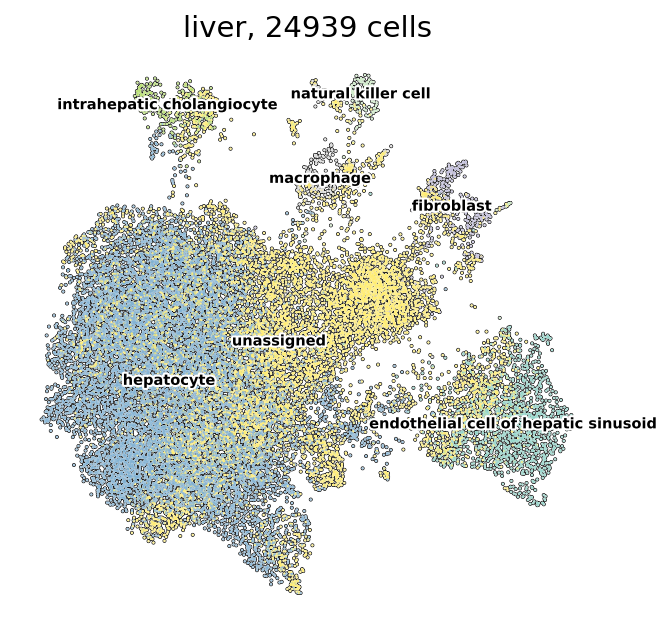

In [68]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(sn_adata, color='annotations_v1', add_outline=True, legend_loc='on data',
               legend_fontsize=7, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {n_cells} cells', palette='Set3')

### Run SCVI after cleaning up data

In [77]:
# Remove clusters showing multiple marker expression OR no expression of any marker
sn_adata = sn_adata[~sn_adata.obs['leiden'].isin(['3','8','7','10','9','16']),:]

Trying to set attribute `.uns` of view, copying.


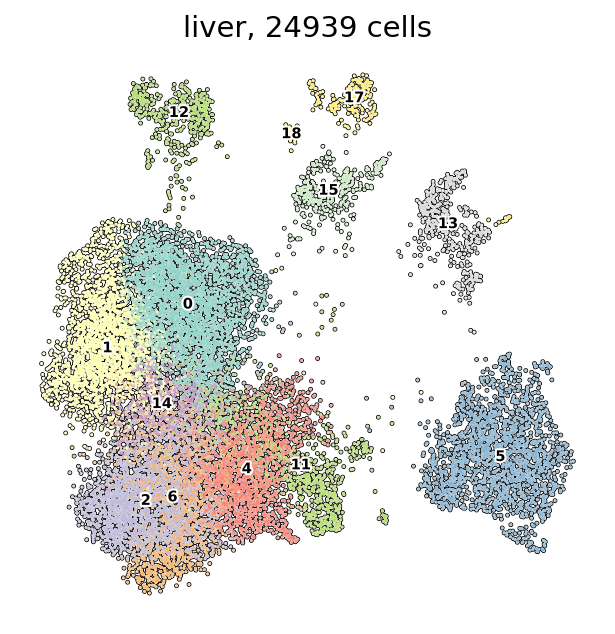

In [79]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(sn_adata, color='leiden', add_outline=True, legend_loc='on data',
               legend_fontsize=7, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {n_cells} cells', palette='Set3')

In [80]:
# copy raw-counts on adata.X before running SCVI again 
sn_adata.X = sn_adata.layers['counts'].copy() 

### Run scvi again after cleaning up the object
We re-cluster the data and generate a new UMAP after removing the contaminated cells. The new UMAP structure should not be as affected by the contamination anymore. Though for some organs, it might be necessary to perform additional rounds of cleaning<br> 

In [81]:
sn_adata = utils.run_scvi(sn_adata, n_layers=2, n_latent=64)

normalizing counts per cell
    finished (0:00:00)


INFO     Using batches from adata.obs["10X_run"]                                             
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 16134 cells, 33567 vars, 6        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [26:32<00:00,  3.98s/it, loss=4.49e+03, v_num=1]


In [82]:
sn_adata = utils.compute_neighbors(sn_adata, use_rep='X_scVI')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:31)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


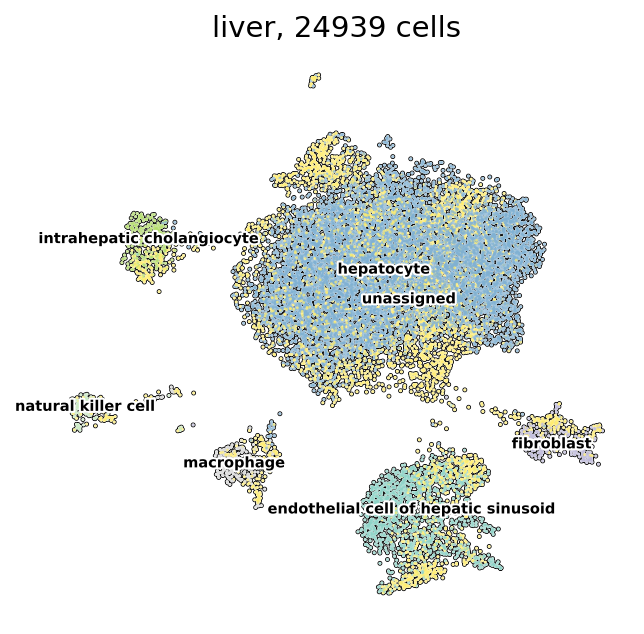

In [83]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(sn_adata, color='annotations_v1', add_outline=True, legend_loc='on data',
               legend_fontsize=7, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {n_cells} cells', palette='Set3')

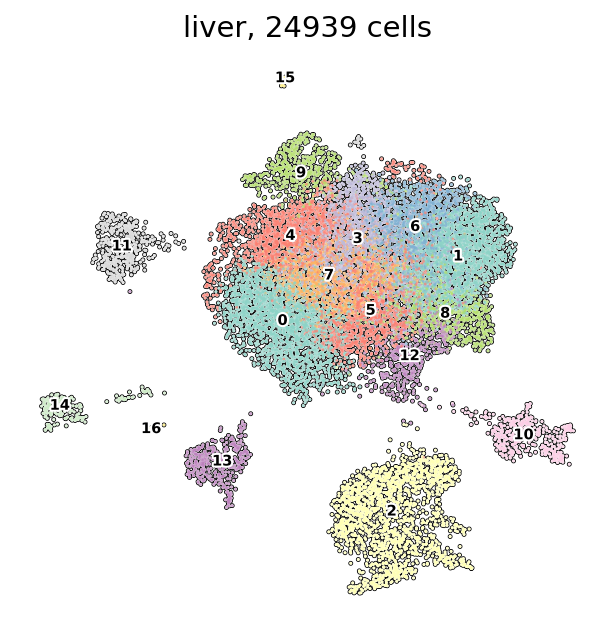

In [89]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(sn_adata, color='leiden', add_outline=True, legend_loc='on data',
               legend_fontsize=7, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {n_cells} cells', palette='Set3')

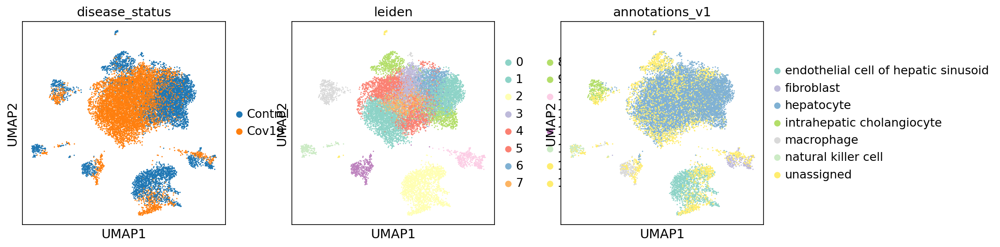

In [92]:
sc.pl.umap(sn_adata, color=['disease_status','leiden','annotations_v1'])

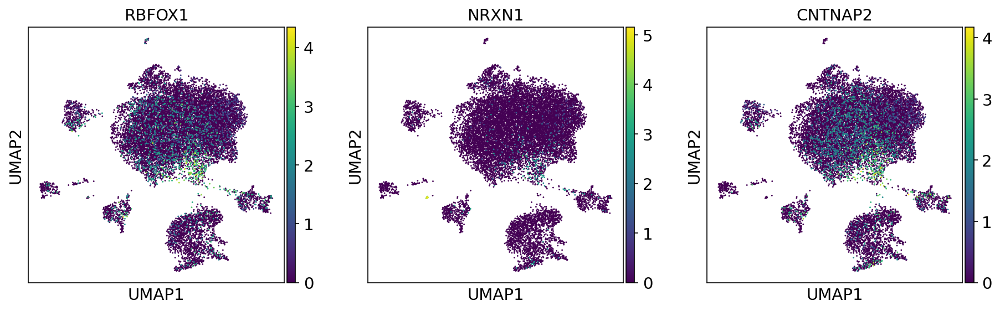

In [87]:
# contaminating genes 
sc.pl.umap(sn_adata, color=['RBFOX1', 'NRXN1', 'CNTNAP2'])

Remove a single cluster that still shows high level of contamination with neuronal markers (hepatocyte + neuron markers). 

In [96]:
sn_adata = sn_adata[~sn_adata.obs['leiden'].isin(['12','15','16']),:]

In [97]:
sn_adata.obs['annotations_v2'] = sn_adata.obs['annotations_v1'].astype(str)

Trying to set attribute `.obs` of view, copying.


In [98]:
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['2']),'annotations_v2'] = 'endothelial cell of hepatic sinusoid'
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['13']),'annotations_v2'] = 'macrophage'
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['10']),'annotations_v2'] = 'fibroblast'
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['11']),'annotations_v2'] = 'intrahepatic cholangiocyte'
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['14']),'annotations_v2'] = 'natural killer cell'

# all other clusters are hepatocytes
sn_adata.obs.loc[sn_adata.obs['annotations_v2'].isin(['unassigned']),'annotations_v2'] = 'hepatocyte'

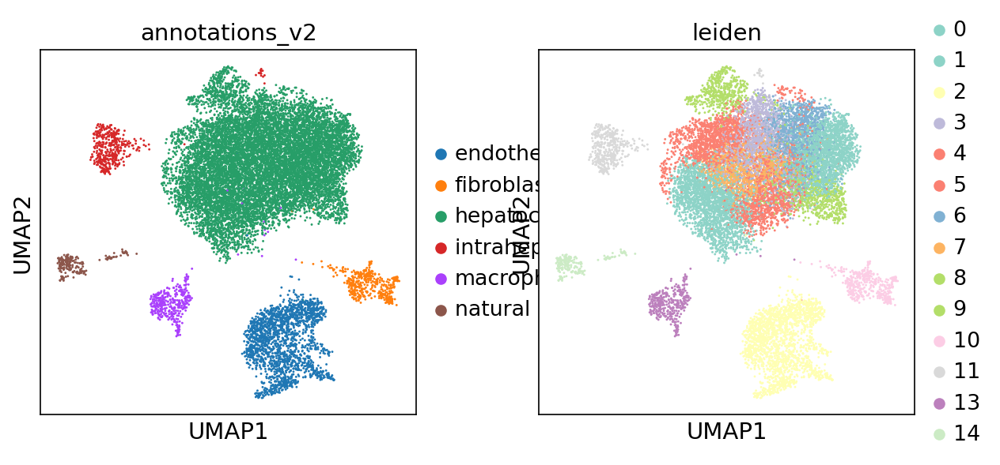

In [126]:
sc.pl.umap(sn_adata, 
          color=['annotations_v2', 'leiden'])

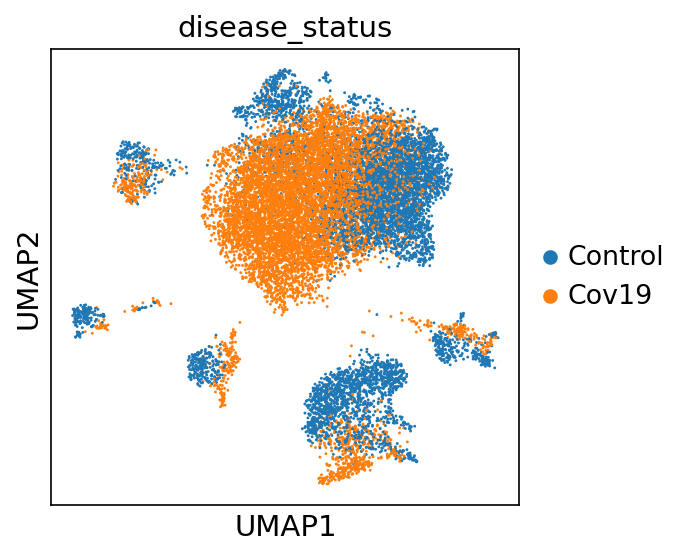

In [125]:
sc.pl.umap(sn_adata,
          color = 'disease_status')

In [90]:
sn_adata.obs['annotations_v2'].value_counts()

hepatocyte                              13438
endothelial cell of hepatic sinusoid     1346
intrahepatic cholangiocyte                333
fibroblast                                317
macrophage                                236
natural killer cell                        75
Name: annotations_v2, dtype: int64

In [101]:
sn_adata.obs['annotations_v2'].value_counts()

hepatocyte                              12338
endothelial cell of hepatic sinusoid     1932
fibroblast                                426
intrahepatic cholangiocyte                420
macrophage                                390
natural killer cell                       206
Name: annotations_v2, dtype: int64

In [102]:
# replace the main annotation column
sn_adata.obs['annotations_v1'] = sn_adata.obs['annotations_v2']

Save final object 

## Final summary

In [104]:
cell_type_counts = sn_adata.obs.groupby(by=['annotations_v1','disease_status']).count()['leiden'].reset_index()

In [105]:
cell_type_counts['log_n_cells'] = np.log10(cell_type_counts['leiden'])

In [106]:
cell_type_counts.head()

,annotations_v1,disease_status,leiden,log_n_cells
0,endothelial cell of hepatic sinusoid,Control,1420,3.152288
1,endothelial cell of hepatic sinusoid,Cov19,512,2.709270
2,fibroblast,Control,265,2.423246
3,fibroblast,Cov19,161,2.206826
4,hepatocyte,Control,4493,3.652536


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: hepatocyte, stromal, endothelium, etc.


{'mainplot_ax': <AxesSubplot:>,
 'group_extra_ax': <AxesSubplot:>,
 'gene_group_ax': <AxesSubplot:>,
 'size_legend_ax': <AxesSubplot:title={'center':'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <AxesSubplot:title={'center':'cellbender'}>}

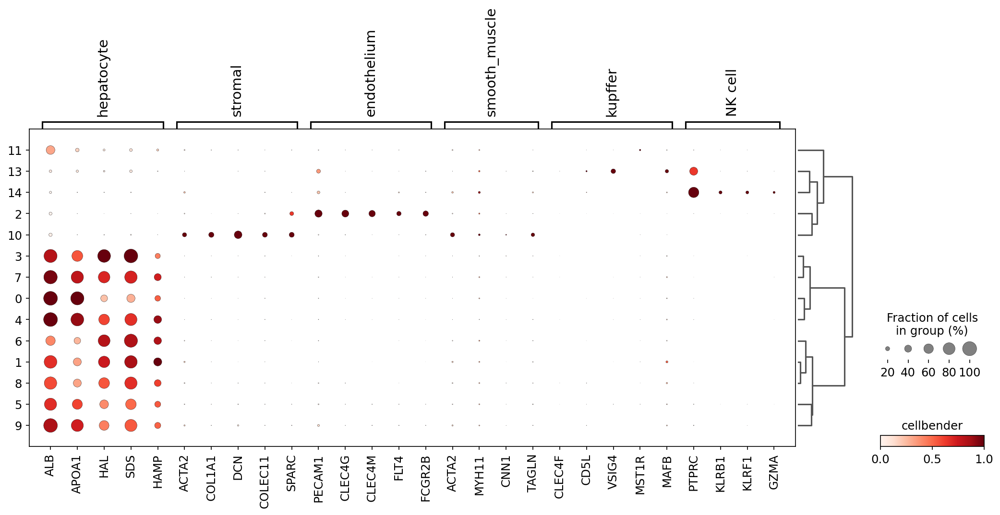

In [119]:
fig, (ax1) = plt.subplots(1, 1, figsize=(17,7), gridspec_kw={'wspace':0.9})
sc.tl.dendrogram(sn_adata, groupby='leiden')
sc.pl.dotplot(sn_adata, 
              var_names= utils.get_markers(tissue),
              layer='counts',
              groupby='leiden',
              log=True,
              standard_scale='var',
              colorbar_title = 'cellbender',
              dendrogram=True, ax = ax1, show = False)

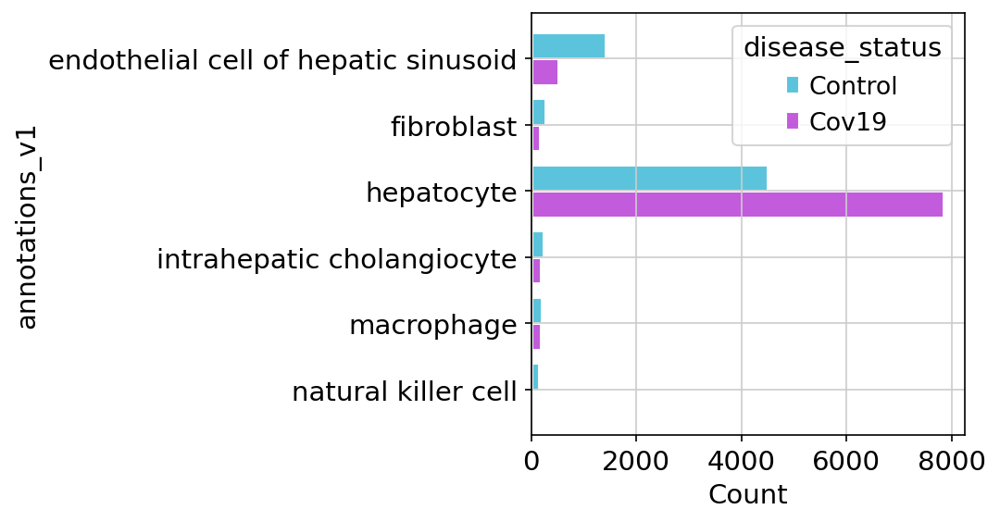

In [120]:
import seaborn as sns

ax = sns.histplot(
    cell_type_counts,
    y='annotations_v1',
    # Use the value variable here to turn histogram counts into weighted
    # values.
    weights='leiden',
    hue='disease_status',
    multiple='dodge',
    palette=['#24b1d1', '#ae24d1'],
    # Add white borders to the bars.
    edgecolor='white',
    # Shrink the bars a bit so they don't touch.
    shrink=0.8
)

In [108]:
sn_adata

AnnData object with n_obs × n_vars = 15712 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'doublet_score', 'predicted_doublet', 'cell_id', 'annotations_v1', 'annotations_v2'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: '10X_run_colors', '_scvi', 'dendrogram_10X_run', 'dendrogram_leiden', 'disease_status_colors', 'leiden', 'leiden_colors', 'neighbors', 'predicted_doublet_colors', 'rank_genes_groups', 'umap', 'annotations_v1_colors', 'log1p', 'annotations_v2_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [121]:
stacked_df = sn_adata.obs[['disease_status', 'annotations_v1']]
cluster_disease = stacked_df.pivot_table(index='annotations_v1', columns=['disease_status'], aggfunc='size')
cluster_disease_pct = cluster_disease.div(cluster_disease.sum(axis=0), axis=1) * 100

(array([  0.,  20.,  40.,  60.,  80., 100.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

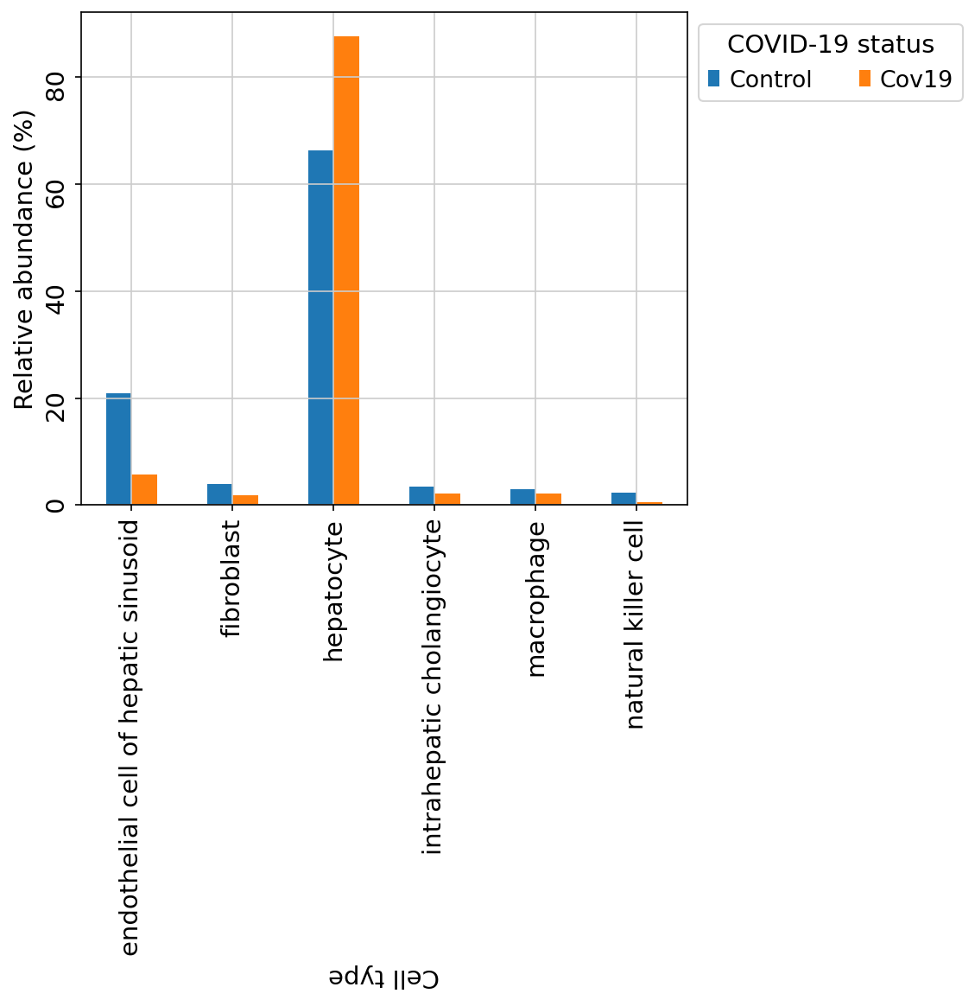

In [122]:
cluster_disease_pct.plot(kind='bar', stacked=False, figsize=(6, 5))
plt.legend(loc='upper left', 
           title='COVID-19 status',
           bbox_to_anchor=(1, 1), 
           ncol=2
          )
plt.ylabel('Count');
plt.ylabel('Relative abundance (%)');
x = plt.xlabel('Cell type');
x.set_rotation(180)
plt.yticks(rotation = 90)

In [124]:
tissue_objects_path= '/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects/liver'
sn_adata.write(f'{tissue_objects_path}/{tissue}_cellbender_scvi.h5ad')

In [127]:
pwd

'/mnt/ibm_lg/alejandro/covid-tissue-atlas/notebooks/tissue_optimization_notebooks'